In [1]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
import panel as pn
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import googlemaps
import networkx as nx
import json
pn.extension()

## Get the sitemap.xml file from lyft.com and obtain list xml files

https://www.lyft.com/sitemap.xml

In [45]:
sitemap_r = requests.get('https://www.lyft.com/sitemap.xml')
sitemap_xml = sitemap_r.text
sitemap_soup = BeautifulSoup(sitemap_xml, 'xml')
sitemap_locs = sitemap_soup.find_all('loc')

In [47]:
sitemap_list = [loc.text for loc in sitemap_locs]

In [48]:
sitemap_list

['https://cdn.lyft.com/brandfe/sitemap-lyft.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-1.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-11.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-12.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-13.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-14.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-15.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-16.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-17.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-18.xml',
 'https://cdn.lyft.com/brandfe/sitemap-top-venues-19.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-1.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-2.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-3.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-4.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-5.xml',
 'https://cdn.lyft.com/brandfe/sitemap-routes-6.xml',
 'https://cdn.lyft.com/brandfe/sitema

## For each sitemap xml file, compile top venue and route links 

In [134]:
lyft_venue_test = 'https://cdn.lyft.com/brandfe/sitemap-top-venues-19.xml'

In [135]:
lyft_route_test = 'https://cdn.lyft.com/brandfe/sitemap-routes-2.xml'

In [140]:
def get_routes(link):
    response = requests.get(link)
    xml = response.content
    soup = BeautifulSoup(xml, 'xml')
    
    locs = soup.find_all('loc')
    mods = soup.find_all('lastmod')
    
    loc_list = [loc.text for loc in locs]
    mod_list = [mod.text for mod in mods]
    
    return list(zip(loc_list, mod_list))

In [187]:
test_routes = get_routes(lyft_route_test)
len(test_routes)

50000

In [188]:
test_routes[0]

('https://www.lyft.com/rider/routes/xcape-room-warehouse-to-red-roof-inn-amarillo-airportdowntown',
 '2019-11-22')

In [142]:
master_routes_list = []

for xml_link in tqdm(sitemap_list):
    if 'routes' in xml_link or 'venue' in xml_link:
        print(f'Requesting routes for sitemap xml link: {xml_link}')
        link_routes = get_routes(xml_link)
        master_routes_list = master_routes_list + link_routes

  0%|                                                                                           | 0/39 [00:00<?, ?it/s]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-1.xml


  5%|████▎                                                                              | 2/39 [00:05<01:47,  2.91s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-11.xml


  8%|██████▍                                                                            | 3/39 [00:12<02:29,  4.14s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-12.xml


 10%|████████▌                                                                          | 4/39 [00:20<02:58,  5.10s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-13.xml


 13%|██████████▋                                                                        | 5/39 [00:27<03:18,  5.85s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-14.xml


 15%|████████████▊                                                                      | 6/39 [00:34<03:25,  6.24s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-15.xml


 18%|██████████████▉                                                                    | 7/39 [00:42<03:31,  6.60s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-16.xml


 21%|█████████████████                                                                  | 8/39 [00:49<03:34,  6.91s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-17.xml


 23%|███████████████████▏                                                               | 9/39 [00:57<03:30,  7.01s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-18.xml


 26%|█████████████████████                                                             | 10/39 [01:05<03:29,  7.24s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-top-venues-19.xml


 28%|███████████████████████▏                                                          | 11/39 [01:06<02:31,  5.40s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-1.xml


 31%|█████████████████████████▏                                                        | 12/39 [01:13<02:43,  6.05s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-2.xml


 33%|███████████████████████████▎                                                      | 13/39 [01:21<02:51,  6.58s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-3.xml


 36%|█████████████████████████████▍                                                    | 14/39 [01:29<02:55,  7.03s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-4.xml


 38%|███████████████████████████████▌                                                  | 15/39 [01:37<02:53,  7.22s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-5.xml


 41%|█████████████████████████████████▋                                                | 16/39 [01:44<02:43,  7.11s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-6.xml


 44%|███████████████████████████████████▋                                              | 17/39 [01:52<02:45,  7.55s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-7.xml


 46%|█████████████████████████████████████▊                                            | 18/39 [02:01<02:48,  8.05s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-8.xml


 49%|███████████████████████████████████████▉                                          | 19/39 [02:08<02:34,  7.74s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-9.xml


 51%|██████████████████████████████████████████                                        | 20/39 [02:16<02:24,  7.61s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-10.xml


 54%|████████████████████████████████████████████▏                                     | 21/39 [02:25<02:24,  8.01s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-11.xml


 56%|██████████████████████████████████████████████▎                                   | 22/39 [02:32<02:11,  7.71s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-12.xml


 59%|████████████████████████████████████████████████▎                                 | 23/39 [02:39<02:03,  7.74s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-13.xml


 62%|██████████████████████████████████████████████████▍                               | 24/39 [02:47<01:55,  7.69s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-14.xml


 64%|████████████████████████████████████████████████████▌                             | 25/39 [02:57<01:55,  8.27s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-15.xml


 67%|██████████████████████████████████████████████████████▋                           | 26/39 [03:04<01:43,  7.98s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-16.xml


 69%|████████████████████████████████████████████████████████▊                         | 27/39 [03:12<01:35,  7.93s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-17.xml


 72%|██████████████████████████████████████████████████████████▊                       | 28/39 [03:20<01:28,  8.01s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-18.xml


 74%|████████████████████████████████████████████████████████████▉                     | 29/39 [03:27<01:17,  7.75s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-19.xml


 77%|███████████████████████████████████████████████████████████████                   | 30/39 [03:35<01:09,  7.78s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-20.xml


 79%|█████████████████████████████████████████████████████████████████▏                | 31/39 [03:43<01:02,  7.86s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-21.xml


 82%|███████████████████████████████████████████████████████████████████▎              | 32/39 [03:52<00:58,  8.35s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-22.xml


 85%|█████████████████████████████████████████████████████████████████████▍            | 33/39 [04:00<00:48,  8.03s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-23.xml


 87%|███████████████████████████████████████████████████████████████████████▍          | 34/39 [04:07<00:38,  7.77s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-24.xml


 90%|█████████████████████████████████████████████████████████████████████████▌        | 35/39 [04:14<00:29,  7.50s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-25.xml


 92%|███████████████████████████████████████████████████████████████████████████▋      | 36/39 [04:22<00:22,  7.63s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-26.xml


 95%|█████████████████████████████████████████████████████████████████████████████▊    | 37/39 [04:30<00:15,  7.77s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-27.xml


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [04:37<00:07,  7.66s/it]

Requesting routes for sitemap xml link: https://cdn.lyft.com/brandfe/sitemap-routes-28.xml


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [04:45<00:00,  7.32s/it]


In [146]:
len(master_routes_list)

1853240

In [189]:
master_routes_list[50000:50050]

[('https://www.lyft.com/rider/city-guides/top-parking-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-herbs-and-spices-store-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-volleyball-court-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-video-store-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-bridal-shop-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-israeli-restaurant-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-zoo-washington', '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-general-college-and-university-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-hostel-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-dessert-shop-washington',
  '2020-02-07'),
 ('https://www.lyft.com/rider/city-guides/top-middle-school-washington',
  '2020-02-07'),
 ('htt

In [193]:
def split_route_orig_dest(route, pos):
    
    route_split = route.split('/')[-1].split('-to-')
    loc = route_split[pos].replace('-', '+')
    return loc

In [195]:
link_df = pd.DataFrame(master_routes_list, columns=['route_link', 'modified_date'])
link_df.drop_duplicates(subset='route_link', inplace=True)

In [196]:
link_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1705146 entries, 0 to 1853239
Data columns (total 2 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   route_link     object
 1   modified_date  object
dtypes: object(2)
memory usage: 39.0+ MB


In [197]:
route_df = link_df[~link_df['route_link'].str.contains('/top-')].copy()

In [198]:
route_df['origin_string'] = route_df['route_link'].apply(lambda x: split_route_orig_dest(x, 0))
route_df['destination_string'] = route_df['route_link'].apply(lambda x: split_route_orig_dest(x, 1))

In [199]:
route_df.head()

,route_link,modified_date,origin_string,destination_string
453240,https://www.lyft.com/rider/routes/zuckerberg-s...,2019-11-22,zuckerberg+sf+general+hospital,sutter+health+cpmc
453241,https://www.lyft.com/rider/routes/the-forum-to...,2019-11-22,the+forum,los+angeles+intl+airport
453242,https://www.lyft.com/rider/routes/welcome-to-e...,2019-11-22,welcome,env+chicago
453243,https://www.lyft.com/rider/routes/ucla-to-usc-...,2019-11-22,ucla,usc+commencement
453244,https://www.lyft.com/rider/routes/ucla-to-smc-...,2019-11-22,ucla,smc+main+campus


In [386]:
route_df.to_csv('rout_export.csv', index=False)

## Explore the routes a bit

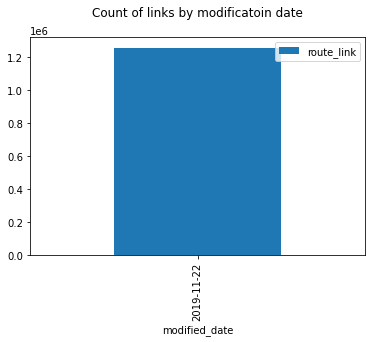

In [200]:
route_df.groupby(by='modified_date').agg({'route_link': 'size'}).plot(kind='bar')
plt.title('Count of links by modificatoin date\n')
plt.show()

In [203]:
route_df[(route_df['origin_string'].str.contains('seatac')) | (route_df['destination_string'].str.contains('seatac')) | (route_df['origin_string'].str.contains('seattle')) | (route_df['destination_string'].str.contains('seattle'))]

,route_link,modified_date,origin_string,destination_string
453257,https://www.lyft.com/rider/routes/the-westin-d...,2019-11-22,the+westin+downtown+seattle,google+building+n34th501
453377,https://www.lyft.com/rider/routes/amazon-oscar...,2019-11-22,amazon+oscar,seattle+center
453378,https://www.lyft.com/rider/routes/amazon-oscar...,2019-11-22,amazon+oscar,seattle+cruise+terminal
453403,https://www.lyft.com/rider/routes/hyatt-regenc...,2019-11-22,hyatt+regency+seattle,amazon+nessie
453407,https://www.lyft.com/rider/routes/hyatt-regenc...,2019-11-22,hyatt+regency+seattle,3rd+ave+transit+corridor
...,...,...,...,...
1811990,https://www.lyft.com/rider/routes/hampton-inn-...,2019-11-22,hampton+inn+and+suites+seattle+airport+28th+ave,best+western+plus+tacoma+dome+hotel
1811991,https://www.lyft.com/rider/routes/hampton-inn-...,2019-11-22,hampton+inn+and+suites+seattle+airport+28th+ave,courtyard+by+marriott+seattle+federal+way
1811994,https://www.lyft.com/rider/routes/maytown-safe...,2019-11-22,maytown+safety+rest+area,courtyard+by+marriott+seattle+federal+way
1811996,https://www.lyft.com/rider/routes/comfort-inn-...,2019-11-22,comfort+inn,courtyard+by+marriott+seattle+federal+way


In [204]:
seattle_df = route_df[(route_df['origin_string'].str.contains('seatac')) | (route_df['destination_string'].str.contains('seatac')) | (route_df['origin_string'].str.contains('seattle')) | (route_df['destination_string'].str.contains('seattle'))]

In [206]:
seattle_df.groupby(by='origin_string').agg({'destination_string': "size"}).sort_values(by='destination_string', ascending=False)

,destination_string
origin_string,
seattle+tacoma+international+airport+sea,192
seattle+art+museum,94
doubletree+by+hilton+hotel+seattle+airport,67
seattle+center,64
seattle+taproom,61
...,...
best+western+plus+tacoma+dome+hotel,1
pelindaba+lavender+farm,1
fort+worden+state+park,1


In [2]:
seattle_df = pd.read_csv('seattle_route_export.csv')

In [3]:
seattle_df.groupby(by='destination_string').agg({'origin_string': "size"}).sort_values(by='origin_string', ascending=False).head(25)

,origin_string
destination_string,
seattle+airport+marriott,152
hilton+seattle+airport+and+conference+center,134
doubletree+by+hilton+hotel+seattle+airport,125
pan+pacific+seattle,114
kimpton+hotel+monaco+seattle,112
warwick+seattle+hotel,111
seattle+center,111
the+arctic+club+seattle+++a+doubletree+by+hilton+hotel,100
seattle+center+station+++seattle+center+monorail,99


In [208]:
origs = seattle_df['origin_string'].unique().tolist()
dests = seattle_df['destination_string'].unique().tolist()
places = list(set(origs + dests))

In [266]:
place_dict = {}
for i in range(len(places)):
    place_dict[places[i]] = i

In [267]:
G = nx.Graph()

In [268]:
for i in range(len(seattle_df)):
    u = place_dict[seattle_df['origin_string'].iloc[i]]
    v = place_dict[seattle_df['destination_string'].iloc[i]]
    G.add_edge(u, v)

In [271]:
G.degree(225) # how many out degrees from seatac airport

192

In [304]:
# G.edges

In [262]:
# nx.draw(G, with_labels=True, font_weight='bold')
# nx.draw_shell(G, nlist=[range(5, 10), range(5)], with_labels=True, font_weight='bold')
# plt.show()

In [305]:
pos = nx.random_layout(G)
pos2 = nx.random_layout(G)

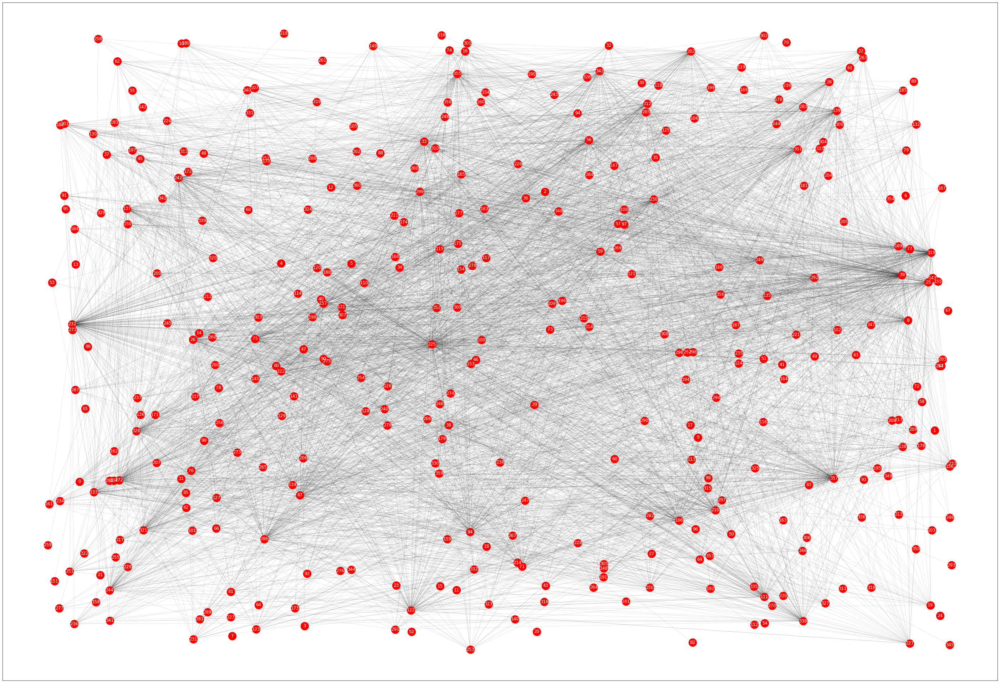

In [315]:
plt.figure(figsize=(50,35))
# nx.draw(G, with_labels=True, node_size=10)
nx.draw_networkx(G, pos, node_size=500, node_color='red', width=.1, font_color='white')
plt.savefig('seattle_route_network.png')
plt.show()

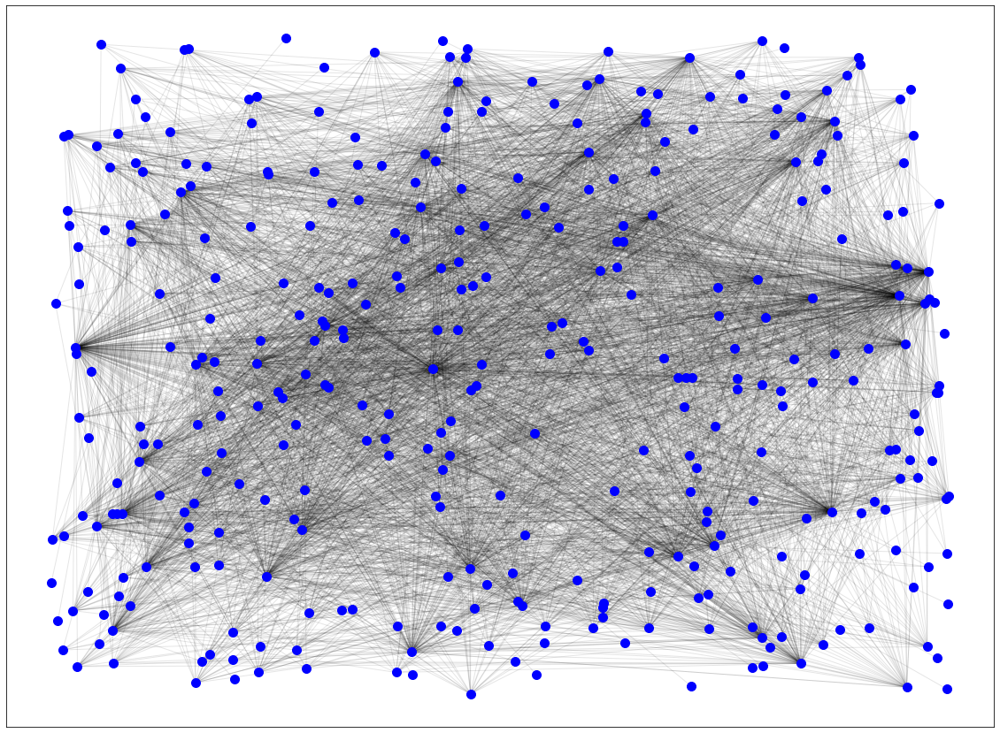

In [312]:
plt.figure(figsize=(20,15))
nx.draw_networkx_nodes(G, pos, node_size=100, node_color="blue")
nx.draw_networkx_edges(G, pos, alpha=0.1)
plt.show()

In [269]:
place_dict['seattle+tacoma+international+airport+sea']

225

In [284]:
# for neighbor in G.neighbors(225):
#     print(neighbor)

In [252]:
pp.pprint(place_dict)

{   '24+hour+fitness': 125,
    '3rd+ave+transit+corridor': 228,
    'academic+instructional+center+aic+west': 104,
    'aces+casino+and+sports+bar': 276,
    'acme+bowl': 173,
    'aladdin+motor+inn': 162,
    'alamo+rent+a+car': 47,
    'alaska+airlines+field+at+husky+stadium': 92,
    'alaska+lodge': 281,
    'alki+beach+park': 41,
    'amazon+alexandria': 17,
    'amazon+blackfoot': 212,
    'amazon+coral': 258,
    'amazon+day+1': 136,
    'amazon+fiona+obidos': 167,
    'amazon+kumo': 60,
    'amazon+mayday': 53,
    'amazon+nessie': 234,
    'amazon+oscar': 3,
    'amazon+otter': 9,
    'amazon+port+99': 174,
    'amazon+roxanne': 27,
    'amazon+stackhouse': 21,
    'amazon+triumph+w': 116,
    'amazon+verzea': 277,
    'amc+loews+cascade+mall+14': 13,
    'amc+loews+lakewood+towne+center+12': 29,
    'amc+pacific+place+11': 134,
    'amc+southcenter+16': 48,
    'anacortes+ferry+terminal': 215,
    'anacortes+kayak+tours': 322,
    'angel+of+the+winds+casino': 218,
    'anthon

In [251]:
seattle_df.to_csv('seattle_route_export.csv', index=False)

## Import Google Cloud Platform credentials

In [119]:
json_file = open('gcp_key.json')
json_obj = json.load(json_file)
gcp_key = json_obj['key']

## Request using Google API url requests (for Scrapy)

In [122]:
# maps_url = json_obj['url'].replace('{orig}', '{' + orig + '}').replace('{dest}', '{' + dest + '}') + json_obj['key']

In [124]:
# print(maps_url)

In [32]:
# response = requests.get(maps_url)

In [36]:
# import pprint
# pp = pprint.PrettyPrinter(indent=4)

In [316]:
pp.pprint(response.text)

('{\n'
 '   "geocoded_waypoints" : [\n'
 '      {\n'
 '         "geocoder_status" : "OK",\n'
 '         "place_id" : "ChIJnyaLa3h1lVQR_cx_vRODVLM",\n'
 '         "types" : [ "establishment", "point_of_interest", "shopping_mall" '
 ']\n'
 '      },\n'
 '      {\n'
 '         "geocoder_status" : "OK",\n'
 '         "place_id" : "ChIJ0SDcdKqglVQRPVwOOJN22ls",\n'
 '         "types" : [ "airport", "establishment", "point_of_interest" ]\n'
 '      }\n'
 '   ],\n'
 '   "routes" : [\n'
 '      {\n'
 '         "bounds" : {\n'
 '            "northeast" : {\n'
 '               "lat" : 45.5873321,\n'
 '               "lng" : -122.5495792\n'
 '            },\n'
 '            "southwest" : {\n'
 '               "lat" : 45.4331965,\n'
 '               "lng" : -122.5860742\n'
 '            }\n'
 '         },\n'
 '         "copyrights" : "Map data ©2020",\n'
 '         "legs" : [\n'
 '            {\n'
 '               "distance" : {\n'
 '                  "text" : "12.7 mi",\n'
 '                  "val

In [320]:
json.loads(response.text)

{'geocoded_waypoints': [{'geocoder_status': 'OK',
   'place_id': 'ChIJnyaLa3h1lVQR_cx_vRODVLM',
   'types': ['establishment', 'point_of_interest', 'shopping_mall']},
  {'geocoder_status': 'OK',
   'place_id': 'ChIJ0SDcdKqglVQRPVwOOJN22ls',
   'types': ['airport', 'establishment', 'point_of_interest']}],
 'routes': [{'bounds': {'northeast': {'lat': 45.5873321, 'lng': -122.5495792},
    'southwest': {'lat': 45.4331965, 'lng': -122.5860742}},
   'copyrights': 'Map data ©2020',
   'legs': [{'distance': {'text': '12.7 mi', 'value': 20482},
     'duration': {'text': '18 mins', 'value': 1061},
     'end_address': 'Portland International Airport (PDX), 7000 NE Airport Way, Portland, OR 97218, USA',
     'end_location': {'lat': 45.5873321, 'lng': -122.5860742},
     'start_address': '12000 SE 82nd Ave, Happy Valley, OR 97086, USA',
     'start_location': {'lat': 45.4353214, 'lng': -122.5719699},
     'steps': [{'distance': {'text': '328 ft', 'value': 100},
       'duration': {'text': '1 min', '

In [321]:
json = pn.pane.JSON(json.loads(response.text), name='JSON', height=300, width=1000)
json

JSON(dict, height=300, sizing_mode='fixed', width=1000)

In [126]:
# type(response)

## Simplified request with official googlemaps api library

In [60]:
gmaps = googlemaps.Client(gcp_key)
directions = gmaps.directions(orig, dest)

In [61]:
type(directions)

list

In [63]:
pp.pprint(directions)

[   {   'bounds': {   'northeast': {'lat': 45.5873321, 'lng': -122.5495792},
                      'southwest': {'lat': 45.4331965, 'lng': -122.5860742}},
        'copyrights': 'Map data ©2020',
        'legs': [   {   'distance': {'text': '12.7 mi', 'value': 20482},
                        'duration': {'text': '18 mins', 'value': 1061},
                        'end_address': 'Portland International Airport (PDX), '
                                       '7000 NE Airport Way, Portland, OR '
                                       '97218, USA',
                        'end_location': {   'lat': 45.5873321,
                                            'lng': -122.5860742},
                        'start_address': '12000 SE 82nd Ave, Happy Valley, OR '
                                         '97086, USA',
                        'start_location': {   'lat': 45.4353214,
                                              'lng': -122.5719699},
                        'steps': [   {   'distance': {

In [92]:
json = pn.pane.JSON(directions[0], name='JSON', height=300, width=1000)
json

JSON(dict, height=300, sizing_mode='fixed', width=1000)

In [86]:
top_right_bound = (directions[0]['bounds']['northeast']['lat'], directions[0]['bounds']['northeast']['lng'])
bottom_left_bound = (directions[0]['bounds']['southwest']['lat'], directions[0]['bounds']['southwest']['lng'])

In [87]:
clean_origin = orig.replace('+', ' ')
clean_destination = dest.replace('+', ' ')
clean_origin, clean_destination

('clackamas town center south', 'portland intl airport')

In [322]:
start_address = directions[0]['legs'][0]['start_address']
end_address = directions[0]['legs'][0]['end_address']
start_address, end_address

('12000 SE 82nd Ave, Happy Valley, OR 97086, USA',
 'Portland International Airport (PDX), 7000 NE Airport Way, Portland, OR 97218, USA')

In [95]:
start_location = (directions[0]['legs'][0]['start_location']['lat'], directions[0]['legs'][0]['start_location']['lng'])
end_location = (directions[0]['legs'][0]['end_location']['lat'], directions[0]['legs'][0]['end_location']['lng'])
print(start_location, end_location)

(45.4353214, -122.5719699) (45.5873321, -122.5860742)


In [323]:
total_distance = float(directions[0]['legs'][0]['distance']['text'].split(' ')[0])
unit_distance = directions[0]['legs'][0]['distance']['text'].split(' ')[1]
total_distance, unit_distance

(12.7, 'mi')

In [94]:
for step in directions[0]['legs'][0]['steps']:
    print(step['start_location'], step['end_location'])

{'lat': 45.4353214, 'lng': -122.5719699} {'lat': 45.4344603, 'lng': -122.571974}
{'lat': 45.4344603, 'lng': -122.571974} {'lat': 45.4344438, 'lng': -122.5712163}
{'lat': 45.4344438, 'lng': -122.5712163} {'lat': 45.4333613, 'lng': -122.5711765}
{'lat': 45.4333613, 'lng': -122.5711765} {'lat': 45.43328030000001, 'lng': -122.5648768}
{'lat': 45.43328030000001, 'lng': -122.5648768} {'lat': 45.56702749999999, 'lng': -122.5547175}
{'lat': 45.56702749999999, 'lng': -122.5547175} {'lat': 45.5743242, 'lng': -122.5554548}
{'lat': 45.5743242, 'lng': -122.5554548} {'lat': 45.5804454, 'lng': -122.570664}
{'lat': 45.5804454, 'lng': -122.570664} {'lat': 45.5873321, 'lng': -122.5860742}


In [330]:
steps = directions[0]['legs'][0]['steps']
steps_list = []

for i in range(len(steps)):
    print(i)
#     print(steps[i]['start_location']['lat'], steps[i]['start_location']['lng'])
    steps_list.append((steps[i]['start_location']['lat'], steps[i]['start_location']['lng']))
    if i == len(steps) - 1:
        steps_list.append((steps[i]['end_location']['lat'], steps[i]['end_location']['lng']))

for step in steps_list:
    print(step)

0
1
2
3
4
5
6
7
(45.4353214, -122.5719699)
(45.4344603, -122.571974)
(45.4344438, -122.5712163)
(45.4333613, -122.5711765)
(45.43328030000001, -122.5648768)
(45.56702749999999, -122.5547175)
(45.5743242, -122.5554548)
(45.5804454, -122.570664)
(45.5873321, -122.5860742)


In [363]:
import re
pattern = re.compile(r'([a-zA-Z\+]{1,}\d{1,}(th|rd|st){1,})|(\d{1,}[a-zA-Z\+]{1,})|([a-zA-Z\+]{1,})')
# test_str = 'google+building+n34th501'
test_str = 'google+bellevue+112'
result = pattern.search(test_str).group(0)
result
# matches = pattern.findall(test_str)
# matches

'google+bellevue+'

In [348]:
pattern.search(test_str).group(0)

'google+building+n34th'

In [344]:
len(matches)

1

In [346]:
if len(matches) == 1:
    match_seq = [item for item in matches[0] if len(item) > 0]
match_seq

['google+building+n34th']

In [340]:
match_list = []


In [382]:
def clean_orig_dest_str(x, locale):
    cleaned_str = x + f'+{locale}'
    pattern = re.compile(r'([a-zA-Z\+]{1,}\d{1,}[a-zA-Z\+]{1,})|([a-zA-Z\+]{1,}\d{1,}[a-zA-Z\+]{1,}\+\d{1,})|([a-zA-Z\+]{1,}\+\d{1,})|([a-zA-Z\+]{1,})')
    result = pattern.search(x).group(0)
    if result is not None:
        cleaned_str = result + f'+{locale}'
    return cleaned_str

In [383]:
seattle_df['orig_re_match'] = seattle_df['origin_string'].apply(lambda x: clean_orig_dest_str(x))
seattle_df['dest_re_match'] = seattle_df['destination_string'].apply(lambda x: clean_orig_dest_str(x))

TypeError: clean_orig_dest_str() missing 1 required positional argument: 'locale'

In [384]:
seattle_df[['origin_string','orig_re_match','destination_string','dest_re_match']].head(50)

,origin_string,orig_re_match,destination_string,dest_re_match
453257,the+westin+downtown+seattle,the+westin+downtown+seattle,google+building+n34th501,google+building+n34th
453377,amazon+oscar,amazon+oscar,seattle+center,seattle+center
453378,amazon+oscar,amazon+oscar,seattle+cruise+terminal,seattle+cruise+terminal
453403,hyatt+regency+seattle,hyatt+regency+seattle,amazon+nessie,amazon+nessie
453407,hyatt+regency+seattle,hyatt+regency+seattle,3rd+ave+transit+corridor,rd+ave+transit+corridor
453413,hyatt+regency+seattle,hyatt+regency+seattle,boren+ave+n,boren+ave+n
453527,facebook+seattle,facebook+seattle,tesla+service+bellevue,tesla+service+bellevue
453573,swedish+cherry+hill+campus,swedish+cherry+hill+campus,seattle+tacoma+intl+airport,seattle+tacoma+intl+airport
453574,othello+station,othello+station,seattle+center,seattle+center
453621,odegaard+library,odegaard+library,seattle+tacoma+intl+airport,seattle+tacoma+intl+airport


In [378]:
seattle_df[seattle_df['origin_string'].str.contains('501')]

,route_link,modified_date,origin_string,destination_string,orig_re_match
458373,https://www.lyft.com/rider/routes/google-build...,2019-11-22,google+building+n34th501,facebook+seattle,google+building+n34th
463114,https://www.lyft.com/rider/routes/google-build...,2019-11-22,google+building+n34th501,seattle+tacoma+intl+airport,google+building+n34th


In [374]:
clean_orig_dest_str('google+building+n34th501')

google+building+n34th


'google+building+n34th'